In [2]:
%cd "/content/"
!git clone https://github.com/mpc001/Visual_Speech_Recognition_for_Multiple_Languages.git
%cd "Visual_Speech_Recognition_for_Multiple_Languages"

/content
fatal: destination path 'Visual_Speech_Recognition_for_Multiple_Languages' already exists and is not an empty directory.
/content/Visual_Speech_Recognition_for_Multiple_Languages


In [3]:
!pip install torch torchvision torchaudio
!pip install opencv-python
!pip install scipy
!pip install scikit-image
!pip install av
!pip install six
!pip install mediapipe
!pip install ffmpeg-python

In [4]:
pip install --upgrade --no-deps --force-reinstall git+https://github.com/openai/whisper.git

  Cloning https://github.com/openai/whisper.git to /tmp/pip-req-build-_tisgeaw
  Running command git clone --filter=blob:none --quiet https://github.com/openai/whisper.git /tmp/pip-req-build-_tisgeaw
  Resolved https://github.com/openai/whisper.git to commit 423492dda7806206abe56bdfe427c1096473a020
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for openai-whisper: filename=openai_whisper-20240927-py3-none-any.whl size=802818 sha256=f7a7cc2f2929333111188ab74c7a645aa14a7895cc6d60908a497757caa99341
  Stored in directory: /tmp/pip-ephem-wheel-cache-t_1ug2kj/wheels/8b/6c/d0/622666868c179f156cf595c8b6f06f88bc5d80c4b31dccaa03
Successfully built openai-whisper
  Attempting uninstall: openai-whisper
    Found existing installation: openai-whisper 20240927
    Uninstalling openai-whisper-20240927:
      Successfully uninstalled openai-whisper-20240927


In [5]:
!pip install mock
!pip install pytube

In [6]:
link = 'https://youtu.be/oxXpB9pSETo?feature=shared'
file_path = '/content/data/audio_only.mp4'

In [7]:
import re
import mock

from pytube.cipher import get_throttling_function_code

def patched_throttling_plan(js: str):
    """Patch throttling plan, from https://github.com/pytube/pytube/issues/1498"""
    raw_code = get_throttling_function_code(js)

    transform_start = r"try{"
    plan_regex = re.compile(transform_start)
    match = plan_regex.search(raw_code)

    transform_plan_raw = js

    step_start = r"c\[(\d+)\]\(c\[(\d+)\](,c(\[(\d+)\]))?\)"
    step_regex = re.compile(step_start)
    matches = step_regex.findall(transform_plan_raw)
    transform_steps = []
    for match in matches:
        if match[4] != '':
            transform_steps.append((match[0],match[1],match[4]))
        else:
            transform_steps.append((match[0],match[1]))

    return transform_steps


    try:
        video = YouTube(url)
        audio = video.streams.filter(only_audio=True, file_extension='mp4')[0] # This line seems to be causing the error. Try to get all streams and print them out.
        audio.download(filename=file_path)
    except HTTPError as e:
        print(f"An HTTPError occurred: {e}")

In [8]:
!mkdir -p /content/data
def get_video(_link, _path):
  try:
      yt = YouTube(_link)
  except:
      print("Connection Error")

  yt.streams.filter(file_extension='mp4')
  stream = yt.streams.get_by_itag(139)
  stream.download('',_path)
  title = yt.title
  print("video downloaded")
  return title

In [9]:
!pip install pytube==10.9.3
!pip install pytubefix
from pytubefix import YouTube
title = get_video(link, file_path)


video downloaded


In [10]:
from IPython.display import HTML
from base64 import b64encode


def play_video(video_path, width=200):
  mp4 = open(video_path,'rb').read()
  data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
  return HTML(f"""
  <video width={width} controls>
        <source src="{data_url}" type="video/mp4">
  </video>
  """)

In [11]:
play_video(file_path, width=300)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
openai-whisper 20240927 requires triton>=2.0.0; platform_machine == "x86_64" and sys_platform == "linux" or sys_platform == "linux2", which is not installed.


100%|███████████████████████████████████████| 139M/139M [00:01<00:00, 79.1MiB/s]
/usr/local/lib/python3.10/dist-packages/whisper/__init__.py:146: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this exper

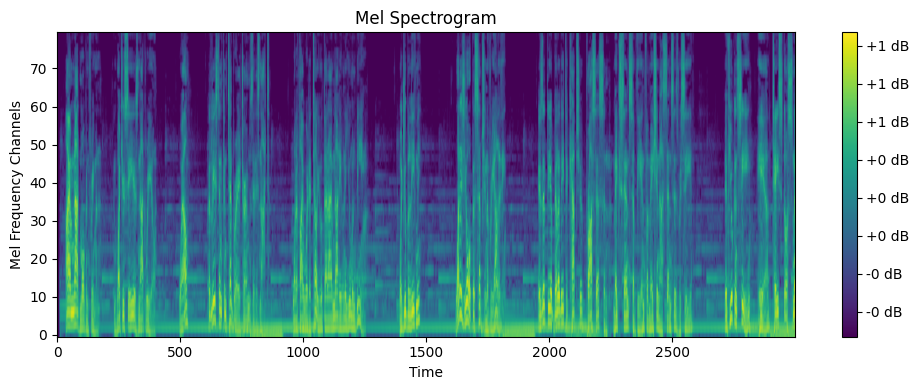

Detected language: en
I am not Morgan Freeman and what you see is not real. Well, at least in contemporary terms it is not. What if I were to tell you that I am not even a human being? Would you believe me? What is your perception of reality? Is it the ability to capture, process, and make sense of the information our senses receive?


In [12]:
!pip install tiktoken
import whisper
import matplotlib.pyplot as plt
import numpy as np
import torch

model = whisper.load_model("base")

audio = whisper.load_audio("/content/data/audio_only.mp4")
audio = whisper.pad_or_trim(audio)

mel = whisper.log_mel_spectrogram(audio).to(model.device)

def plot_mel_spectrogram(mel):
    plt.figure(figsize=(10, 4))
    plt.imshow(mel.cpu().numpy(), aspect='auto', origin='lower')
    plt.title('Mel Spectrogram')
    plt.xlabel('Time')
    plt.ylabel('Mel Frequency Channels')
    plt.colorbar(format="%+2.0f dB")
    plt.tight_layout()
    plt.show()

plot_mel_spectrogram(mel)

_, probs = model.detect_language(mel)
print(f"Detected language: {max(probs, key=probs.get)}")

options = whisper.DecodingOptions()
result = whisper.decode(model, mel, options)

org_audio_transcript=result.text
print(result.text)


In [13]:
!pip install pytubefix
from pytubefix import YouTube

def download_video_only(youtube_url, output_path):
    yt = YouTube(youtube_url)

    video_stream = yt.streams.filter(only_audio=False, file_extension='mp4', progressive=False).first()

    video_stream.download(output_path=output_path, filename='video_only.mp4')

youtube_url = link
download_video_only(youtube_url, '/content/data/')


In [14]:
play_video('/content/data/video_only.mp4', width=300)

In [15]:
!ls /content/Visual_Speech_Recognition_for_Multiple_Languages/pipelines/


data  detectors  metrics  model.py  pipeline.py  tokens


In [16]:
import sys
import os
sys.path.append('/content/Visual_Speech_Recognition_for_Multiple_Languages')

In [17]:
import cv2
import torchvision
from pipelines.data.data_module import AVSRDataLoader
from pipelines.detectors.mediapipe.detector import LandmarksDetector

def save2vid(filename, vid, frames_per_second):
    os.makedirs(os.path.dirname(filename), exist_ok=True)
    torchvision.io.write_video(filename, vid, frames_per_second)

def preprocess_video(src_filename, dst_filename):
    landmarks = landmarks_detector(src_filename)
    data = dataloader.load_data(src_filename, landmarks)
    fps = cv2.VideoCapture(src_filename).get(cv2.CAP_PROP_FPS)
    save2vid(dst_filename, data, fps)
    return

dataloader = AVSRDataLoader(modality="video", speed_rate=1, transform=False, detector="mediapipe", convert_gray=False)
landmarks_detector = LandmarksDetector()

In [18]:
preprocess_video(src_filename="/content/data/video_only.mp4", dst_filename="/content/data/roi.mp4")

/usr/local/lib/python3.10/dist-packages/google/protobuf/symbol_database.py:55: UserWarning: SymbolDatabase.GetPrototype() is deprecated. Please use message_factory.GetMessageClass() instead. SymbolDatabase.GetPrototype() will be removed soon.
  warnings.warn('SymbolDatabase.GetPrototype() is deprecated. Please '


In [19]:
play_video("/content/data/roi.mp4", width=300)

In [20]:
import os
import torch
from pipelines.model import AVSR
from pipelines.data.data_module import AVSRDataLoader
from pipelines.detectors.mediapipe.detector import LandmarksDetector

class InferencePipeline(torch.nn.Module):
    def __init__(self, modality, model_path, model_conf, detector="mediapipe", face_track=False, device="cuda:0"):
        super(InferencePipeline, self).__init__()
        self.device = device
        # modality configuration
        self.modality = modality
        self.dataloader = AVSRDataLoader(modality, detector=detector)
        self.model = AVSR(modality, model_path, model_conf, rnnlm=None, rnnlm_conf=None, penalty=0.0, ctc_weight=0.1, lm_weight=0.0, beam_size=40, device=device)
        if face_track and self.modality in ["video", "audiovisual"]:
            self.landmarks_detector = LandmarksDetector()
        else:
            self.landmarks_detector = None


    def process_landmarks(self, data_filename, landmarks_filename):
        if self.modality == "audio":
            return None
        if self.modality in ["video", "audiovisual"]:
            landmarks = self.landmarks_detector(data_filename)
            return landmarks


    def forward(self, data_filename, landmarks_filename=None):
        assert os.path.isfile(data_filename), f"data_filename: {data_filename} does not exist."
        landmarks = self.process_landmarks(data_filename, landmarks_filename)
        data = self.dataloader.load_data(data_filename, landmarks)
        transcript = self.model.infer(data)
        return transcript

    def extract_features(self, data_filename, landmarks_filename=None, extract_resnet_feats=False):
        assert os.path.isfile(data_filename), f"data_filename: {data_filename} does not exist."
        landmarks = self.process_landmarks(data_filename, landmarks_filename)
        data = self.dataloader.load_data(data_filename, landmarks)
        with torch.no_grad():
            if isinstance(data, tuple):
                enc_feats = self.model.model.encode(data[0].to(self.device), data[1].to(self.device), extract_resnet_feats)
            else:
                enc_feats = self.model.model.encode(data.to(self.device), extract_resnet_feats)
        return enc_feats

In [21]:
%mkdir -p /content/data/
!wget http://www.doc.ic.ac.uk/~pm4115/autoAVSR/LRS3_V_WER19.1.zip -O /content/data/LRS3_V_WER19.1.zip
!unzip -o /content/data/LRS3_V_WER19.1.zip -d /content/data/

--2024-09-30 16:40:08--  http://www.doc.ic.ac.uk/~pm4115/autoAVSR/LRS3_V_WER19.1.zip
Resolving www.doc.ic.ac.uk (www.doc.ic.ac.uk)... 146.169.13.6
Connecting to www.doc.ic.ac.uk (www.doc.ic.ac.uk)|146.169.13.6|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 937274463 (894M) [application/zip]
Saving to: ‘/content/data/LRS3_V_WER19.1.zip’

/content/data/LRS3_ 100%[===================>] 893.85M  13.4MB/s    in 70s     

2024-09-30 16:41:19 (12.8 MB/s) - ‘/content/data/LRS3_V_WER19.1.zip’ saved [937274463/937274463]

Archive:  /content/data/LRS3_V_WER19.1.zip
  inflating: /content/data/LRS3_V_WER19.1/model.json  
  inflating: /content/data/LRS3_V_WER19.1/model.pth  


In [22]:
modality = "video"
model_conf = "/content/data/LRS3_V_WER19.1/model.json"
model_path = "/content/data/LRS3_V_WER19.1/model.pth"
pipeline = InferencePipeline(modality, model_path, model_conf, face_track=True)

/content/Visual_Speech_Recognition_for_Multiple_Languages/pipelines/model.py:47: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  self.model.load_state_dict(torch.load(model_pa

In [23]:
org_video_transcript = pipeline("/content/data/video_only.mp4")
print(org_video_transcript)

I'M NOT MARKET FLEMING I WANT YOU TO THINK IT'S NOT REAL WELL I CAN'T THINK OF TEMPORARY TERMS IT IS NOT BUT I WANT TO TELL YOU THAT I'M NOT EVEN A HUMAN BEING WHAT IS IT THAT I'M NOT EVEN A HUMAN BEING WHO IS IT THAT'S NOT TRUE NOW I DON'T KNOW IF I CAN'T SEE IT BUT THAT'S TRUE NOW I DON'T KNOW IF I CAN'T SEE IT THAT I CAN'T SEE IT THAT I CAN'T SEE IT THAT'S TRUE NOW


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 63.6 MB/s eta 0:00:00
Levenshtein Distance: 313
Normalized Levenshtein Distance: 0.845945945945946
Potentially fake video (mismatch between audio and video transcripts).


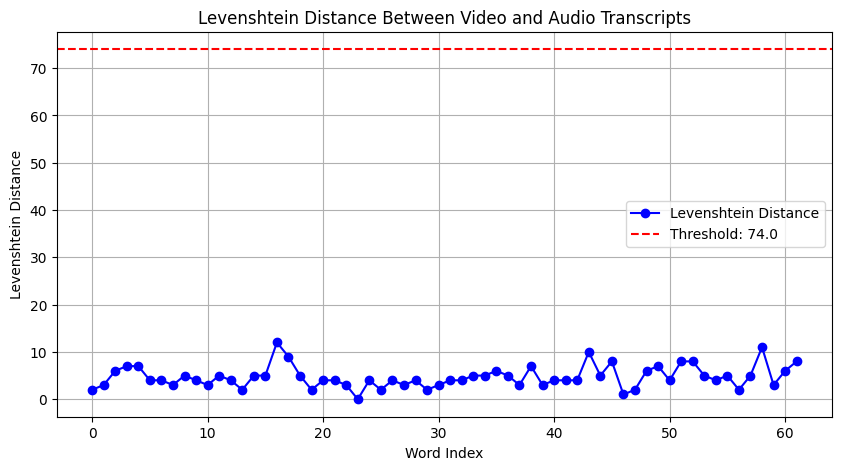

In [24]:
!pip install python-Levenshtein matplotlib

import Levenshtein as lev
import matplotlib.pyplot as plt

video_transcript = org_video_transcript
audio_transcript = org_audio_transcript

distance = lev.distance(video_transcript, audio_transcript)

print(f"Levenshtein Distance: {distance}")

max_len = max(len(video_transcript), len(audio_transcript))
normalized_distance = distance / max_len
print(f"Normalized Levenshtein Distance: {normalized_distance}")

threshold = 0.2
if normalized_distance > threshold:
    print("Potentially fake video (mismatch between audio and video transcripts).")
else:
    print("Video seems authentic.")

def plot_distances(video_transcript, audio_transcript):
    video_words = video_transcript.split()
    audio_words = audio_transcript.split()

    distances = []
    for vw, aw in zip(video_words, audio_words):
        distances.append(lev.distance(vw, aw))

    plt.figure(figsize=(10, 5))
    plt.plot(distances, marker='o', linestyle='-', color='b', label="Levenshtein Distance")
    plt.axhline(y=threshold*max_len, color='r', linestyle='--', label=f"Threshold: {threshold*max_len}")
    plt.xlabel('Word Index')
    plt.ylabel('Levenshtein Distance')
    plt.title('Levenshtein Distance Between Video and Audio Transcripts')
    plt.legend()
    plt.grid(True)
    plt.show()

plot_distances(video_transcript, audio_transcript)
